# Residential Building Analysis#


###Preparation

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


1.   Imort library

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

2.   Load the Dateset:
Residential-Building-Data-Set.xlsx

In [4]:
path = '/content/drive/MyDrive/c6005 group project/Residential-Building-Data-Set.xlsx'
origin_data = pd.read_excel(path)

### Data processing

1.   To check if there are missing values



<font color="red">Code:</font>

In [7]:
missing_values = origin_data.isnull().sum()

print(missing_values)
has_missing_values = origin_data.isnull().values.any()
print("Are there any missing values in the dataset:", has_missing_values)

PROJECT DATES (PERSIAN CALENDAR)            0
Unnamed: 1                                  0
Unnamed: 2                                  0
Unnamed: 3                                  0
PROJECT PHYSICAL AND FINANCIAL VARIABLES    0
                                           ..
Unnamed: 104                                0
Unnamed: 105                                0
Unnamed: 106                                0
OUTPUTS                                     0
Unnamed: 108                                0
Length: 109, dtype: int64
Are there any missing values in the dataset: False


2.   To check if there are duplicate values



<font color="red">Code:</font>

In [8]:
duplicate_rows = origin_data.duplicated()

num_duplicates = duplicate_rows.sum()
print("Number of duplicate values in the dataset:", num_duplicates)
duplicate_data = origin_data[duplicate_rows]
print("Duplicate rows data:\n", duplicate_data)
has_duplicates = num_duplicates > 0
print("Are there any duplicate values in the dataset:", has_duplicates)

Number of duplicate values in the dataset: 0
Duplicate rows data:
 Empty DataFrame
Columns: [PROJECT DATES (PERSIAN CALENDAR), Unnamed: 1, Unnamed: 2, Unnamed: 3, PROJECT PHYSICAL AND FINANCIAL VARIABLES, Unnamed: 5, Unnamed: 6, Unnamed: 7, Unnamed: 8, Unnamed: 9, Unnamed: 10, Unnamed: 11, ECONOMIC VARIABLES AND INDICES IN TIME LAG 1, Unnamed: 13, Unnamed: 14, Unnamed: 15, Unnamed: 16, Unnamed: 17, Unnamed: 18, Unnamed: 19, Unnamed: 20, Unnamed: 21, Unnamed: 22, Unnamed: 23, Unnamed: 24, Unnamed: 25, Unnamed: 26, Unnamed: 27, Unnamed: 28, Unnamed: 29, Unnamed: 30, ECONOMIC VARIABLES AND INDICES IN TIME LAG 2, Unnamed: 32, Unnamed: 33, Unnamed: 34, Unnamed: 35, Unnamed: 36, Unnamed: 37, Unnamed: 38, Unnamed: 39, Unnamed: 40, Unnamed: 41, Unnamed: 42, Unnamed: 43, Unnamed: 44, Unnamed: 45, Unnamed: 46, Unnamed: 47, Unnamed: 48, Unnamed: 49, ECONOMIC VARIABLES AND INDICES IN TIME LAG 3, Unnamed: 51, Unnamed: 52, Unnamed: 53, Unnamed: 54, Unnamed: 55, Unnamed: 56, Unnamed: 57, Unnamed: 58,

3.   To check if there are NAN values



<font color="red">Code:</font>

In [9]:
# Create a Boolean Series indicating whether each value is NaN or not
nan_rows = origin_data.isnull()

# Find all rows with NaN values
nan_data = origin_data[nan_rows.any(axis=1)]

# Check for duplicate values in rows with NaN values
duplicate_nan_rows = nan_data.duplicated()

num_duplicate_nan = duplicate_nan_rows.sum()
print("Number of duplicate NaN rows:", num_duplicate_nan)
duplicate_nan_data = nan_data[duplicate_nan_rows]
print("Duplicate NaN rows data:\n", duplicate_nan_data)
has_duplicate_nan = num_duplicate_nan > 0
print("Are there any duplicate NaN rows in the dataset:", has_duplicate_nan)

Number of duplicate NaN rows: 0
Duplicate NaN rows data:
 Empty DataFrame
Columns: [PROJECT DATES (PERSIAN CALENDAR), Unnamed: 1, Unnamed: 2, Unnamed: 3, PROJECT PHYSICAL AND FINANCIAL VARIABLES, Unnamed: 5, Unnamed: 6, Unnamed: 7, Unnamed: 8, Unnamed: 9, Unnamed: 10, Unnamed: 11, ECONOMIC VARIABLES AND INDICES IN TIME LAG 1, Unnamed: 13, Unnamed: 14, Unnamed: 15, Unnamed: 16, Unnamed: 17, Unnamed: 18, Unnamed: 19, Unnamed: 20, Unnamed: 21, Unnamed: 22, Unnamed: 23, Unnamed: 24, Unnamed: 25, Unnamed: 26, Unnamed: 27, Unnamed: 28, Unnamed: 29, Unnamed: 30, ECONOMIC VARIABLES AND INDICES IN TIME LAG 2, Unnamed: 32, Unnamed: 33, Unnamed: 34, Unnamed: 35, Unnamed: 36, Unnamed: 37, Unnamed: 38, Unnamed: 39, Unnamed: 40, Unnamed: 41, Unnamed: 42, Unnamed: 43, Unnamed: 44, Unnamed: 45, Unnamed: 46, Unnamed: 47, Unnamed: 48, Unnamed: 49, ECONOMIC VARIABLES AND INDICES IN TIME LAG 3, Unnamed: 51, Unnamed: 52, Unnamed: 53, Unnamed: 54, Unnamed: 55, Unnamed: 56, Unnamed: 57, Unnamed: 58, Unnamed:

4.   To check if there are outliers

<font color="red">Code:</font>

In [10]:
# Process only data after row 2, column 5
data_to_clean = origin_data.iloc[2:, 5:]

# IQR
def detect_outliers_iqr(df):
    Q1 = df.quantile(0.25)
    Q3 = df.quantile(0.75)
    IQR = Q3 - Q1
    return (df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR))

# Finding Outliers
outliers_iqr = data_to_clean.apply(detect_outliers_iqr)


In [ ]:
#Represent the outliers by using the word 'Outlier'
outliers_marked = data_to_clean.copy()
outliers_marked[outliers_iqr] = 'Outlier'
outliers_marked.head(20)

,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,ECONOMIC VARIABLES AND INDICES IN TIME LAG 1,Unnamed: 13,Unnamed: 14,...,Unnamed: 99,Unnamed: 100,Unnamed: 101,Unnamed: 102,Unnamed: 103,Unnamed: 104,Unnamed: 105,Unnamed: 106,OUTPUTS,Unnamed: 108
2,Outlier,Outlier,Outlier,400,963.81,Outlier,Outlier,3152,106,103.03,...,1316.3,8364.78,8393,90.95,89.79,11379.37,44835,929027.1,Outlier,Outlier
3,Outlier,840,480,100,689.84,Outlier,630,1627,41,41.25,...,765.8,1755,4930,38.7,32.04,1653.06,37933,377828.6,1200,170
4,685,202,13.7,20,459.54,4,140,2580.93,12.1,10.03,...,152.25,1442.31,Outlier,9.73,8.34,686.16,8194,122031.7,165,30
5,3000,800,Outlier,410,631.91,Outlier,Outlier,6790,203.8,162.84,...,2244.1,9231.76,9286,136.6,140.2,9821,48260,1734973.5,Outlier,Outlier
6,2500,640,Outlier,420,647.32,Outlier,Outlier,6790,203.8,162.84,...,2244.1,9231.76,9286,136.6,140.2,9821,48260,1734973.5,Outlier,Outlier
7,1810,492,Outlier,Outlier,843.98,Outlier,Outlier,6458,224.7,198.55,...,2526.4,9254.28,9306,136.56,138.8,9291,12393,1732937.5,Outlier,Outlier
8,1150,380,575,Outlier,590.68,6,Outlier,3131,259.5,204.02,...,3148,9248.4,9380,158.63,169.5,10082,49572,Outlier,Outlier,600
9,2110,540,189.9,90,732.14,5,690,4638,34.6,37.16,...,550.4,1755,4252,30.13,21.54,2134.49,18409,402158.1,870,110
10,3030,930,515.1,170,1007.38,3,1500,7196,51.3,56.13,...,764.5,1755,8420,54.62,44.79,2206.19,40234,629797.2,1700,190
11,750,200,90,120,846.15,6,1100,3213,44.5,49.8,...,663.97,1755,5827,41.79,34.76,1527.55,19533,409677.9,1500,150


In [11]:
# Replacing outliers directly on the original data
for column in data_to_clean.columns:
    origin_data.iloc[2:, 5:][column][outliers_iqr[column]] = data_to_clean[column].mean()

<ipython-input-11-96893c6d3b4b>:3: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  origin_data.iloc[2:, 5:][column][outliers_iqr[column]] = data_to_clean[column].mean()
<ipython-input-11-96893c6d3b4b>:3: FutureWarning: ChainedAssignmentError: 

**Result:**

* By checking the table, the outliers of each column can be seen clearly and they are replaced by the mean eventually.

5.   Rename all columns and use the mean values to aggregate the columns

<font color="red">Code:</font>

In [12]:
# PROJECT PHYSICAL AND FINANCIAL VARIABLES
# v1-v8
data = pd.DataFrame()
PROJECT_PHYSICAL_AND_FINANCIAL_VARIABLES = origin_data.iloc[1:, 4:12]

index = 0
while index < 8:
    name = 'v-' + str(index+1)
    data[name] = PROJECT_PHYSICAL_AND_FINANCIAL_VARIABLES.iloc[:, index]
    index = index + 1

# v11-v29-mean
start_column = 12
jump = 19

v1 = origin_data.iloc[1:, start_column:start_column+jump]
v2 = origin_data.iloc[1:, start_column+jump:start_column+jump*2]
v3 = origin_data.iloc[1:, start_column+jump*2:start_column+jump*3]
v4 = origin_data.iloc[1:, start_column+jump*3:start_column+jump*4]
v5 = origin_data.iloc[1:, start_column+jump*4:start_column+jump*5]

index = 0
while index < 19:
    v1_to_v5_mean = (v1.iloc[:, index] + v2.iloc[:, index] + v3.iloc[:, index] + v4.iloc[:, index] + v5.iloc[:, index]) / 5
    column_name = 'v-' +  str(index + 11)
    data[column_name] = v1_to_v5_mean
    index =  index + 1

# output
data['v-9'] = origin_data.iloc[1:, -2]
data['v-10'] = origin_data.iloc[1:, -1]

data


,v-1,v-2,v-3,v-4,v-5,v-6,v-7,v-8,v-11,v-12,...,v-22,v-23,v-24,v-25,v-26,v-27,v-28,v-29,v-9,v-10
1,1,3150,920,598.5,190,1010.84,16,1200,6282.2,53.92,...,824.22,1755.0,8007.4,64.004,58.608,3402.236,29574.9,607307.5,2200,410
2,1,1725.214286,424.783019,327.174717,400,963.81,6.239892,1087.816712,3249.6,97.24,...,1410.34,8647.788,8675.2,98.188,97.958,12544.81,31950.0,1022789.44,1385.242588,232.169811
3,1,1725.214286,840,480,100,689.84,6.239892,630,2180.4,38.96,...,679.752,1755.0,6915.007116,42.166,34.992,1571.104,27119.6,436471.7,1200,170
4,1,685,202,13.7,20,459.54,4,140,2374.986,11.14,...,188.0,1489.818,7621.065984,10.458,9.278,522.7,18075.15,127630.38,165,30
5,1,3000,800,327.174717,410,631.91,6.239892,1087.816712,6344.0,176.16,...,2709.2,9272.228,9343.0,144.29,150.74,9808.6,34438.0,1875426.6,1385.242588,232.169811
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
368,20,1350,350,108,80,251.37,9,830,3166.0,92.42,...,1350.94,8548.072,8578.8,94.538,94.006,12233.302,29482.05,958166.06,1100,150
369,20,600,150,36,60,299.55,6,570,6185.6,55.48,...,848.8,2988.896,8005.8,66.168,60.886,3665.396,23479.0,616679.0,740,80
370,20,1900,430,285,150,364.41,7,640,2778.6,111.38,...,1720.64,8920.69,8940.2,107.64,108.684,11764.864,30216.9,1157578.8,860,220
371,20,510,160,30.6,60,245.28,9,790,3645.6,69.6,...,1098.46,8065.908,8118.6,79.512,76.556,6122.494,26394.75,760256.02,1100,110


**Result:**

* Skip the first row and store the column names from the 5th to the 12th column as v-1 to v-8 in PROJECT_PHYSICAL_AND_FINANCIAL_VARIABLES.
* Starting from the 13th column, there are five groups of data (each group has 19 columns), and the column names are from v-11 to v-29. Use a while loop to calculate the average of each column in v1 to v5, storing the results in v1 to v5. V1 represents the average for the first year.
* Add the second-to-last column and the last column from origin_data to the data DataFrame, with the column names as v-9 and v-10.

### EDA

EDA was conducted to gain insights into the structure, distribution, and characteristics of the dataset.

<font color="red">Code:</font>

In [13]:
data.describe().T.style.background_gradient()

,count,unique,top,freq
v-1,372.000000,20.000000,20.000000,33.000000
v-2,372.000000,194.000000,1725.214286,24.000000
v-3,372.000000,86.000000,424.783019,22.000000
v-4,372.000000,304.000000,327.174717,34.000000
v-5,372.000000,44.000000,100.000000,23.000000
v-6,372.000000,309.000000,553.189596,6.000000
v-7,372.000000,11.000000,6.000000,111.000000
v-8,372.000000,101.000000,1087.816712,33.000000
v-11,372.000000,67.000000,6344.000000,19.000000
v-12,372.000000,67.000000,176.160000,19.000000


**Result:**

* count: The number of non-null  data points.
* unique: The number of unique values in the column.
* top: The most frequent value.
* freq: The number of times the top value appears.


### Data Cleaning

1.  Use the Correlation Matrix to see the relationships between the columns

<font color="red">Code:</font>

In [14]:
data_cleaned = data.copy()
data_cleaned.corr()

,v-1,v-2,v-3,v-4,v-5,v-6,v-7,v-8,v-11,v-12,...,v-22,v-23,v-24,v-25,v-26,v-27,v-28,v-29,v-9,v-10
v-1,1.000000,-0.380180,-0.398240,-0.339398,-0.266661,-0.824734,0.108505,-0.305358,0.057822,0.130967,...,0.141568,0.130355,0.110390,0.133144,0.130728,0.124114,0.082762,0.152913,-0.317427,-0.252400
v-2,-0.380180,1.000000,0.918540,0.680996,0.257710,0.306973,-0.131951,0.338414,0.056765,0.116423,...,0.110611,0.105921,0.121682,0.128087,0.126056,0.127352,0.061862,0.114462,0.349632,0.215330
v-3,-0.398240,0.918540,1.000000,0.646026,0.231781,0.339907,-0.181368,0.299166,0.036879,0.089278,...,0.083909,0.067409,0.091752,0.095566,0.096154,0.077212,0.068049,0.087188,0.308375,0.205955
v-4,-0.339398,0.680996,0.646026,1.000000,0.645041,0.310865,-0.031955,0.600952,0.188913,0.468783,...,0.456816,0.448432,0.461087,0.496942,0.494899,0.461452,0.367642,0.468496,0.591221,0.607952
v-5,-0.266661,0.257710,0.231781,0.645041,1.000000,0.271370,-0.001584,0.726328,0.298083,0.763870,...,0.762415,0.750070,0.742293,0.795359,0.793805,0.746111,0.638741,0.779912,0.698656,0.884390
v-6,-0.824734,0.306973,0.339907,0.310865,0.271370,1.000000,-0.035590,0.273255,-0.074579,-0.174218,...,-0.179524,-0.125493,-0.137010,-0.156177,-0.159597,-0.094065,-0.076411,-0.200662,0.288439,0.246213
v-7,0.108505,-0.131951,-0.181368,-0.031955,-0.001584,-0.035590,1.000000,-0.007645,0.044558,0.009096,...,-0.000018,0.062540,0.050389,0.042030,0.034610,0.083837,0.101025,0.010838,0.089886,0.094162
v-8,-0.305358,0.338414,0.299166,0.600952,0.726328,0.273255,-0.007645,1.000000,0.287064,0.599486,...,0.584297,0.604320,0.616817,0.659011,0.653376,0.606134,0.502173,0.600358,0.956004,0.704072
v-11,0.057822,0.056765,0.036879,0.188913,0.298083,-0.074579,0.044558,0.287064,1.000000,0.451701,...,0.461669,0.172945,0.398214,0.441464,0.429482,0.144729,0.344172,0.440188,0.264779,0.300809
v-12,0.130967,0.116423,0.089278,0.468783,0.763870,-0.174218,0.009096,0.599486,0.451701,1.000000,...,0.993788,0.853654,0.879778,0.972361,0.974945,0.815384,0.729331,0.981240,0.563716,0.812327


2.  Use the pairplot to see the relationships between the columns

<font color="red">Code:</font>


In [ ]:
sns.pairplot(data_cleaned)
plt.show()

3.  Use the heatmap to see the relationships between the columns clearly

<font color="red">Code:</font>


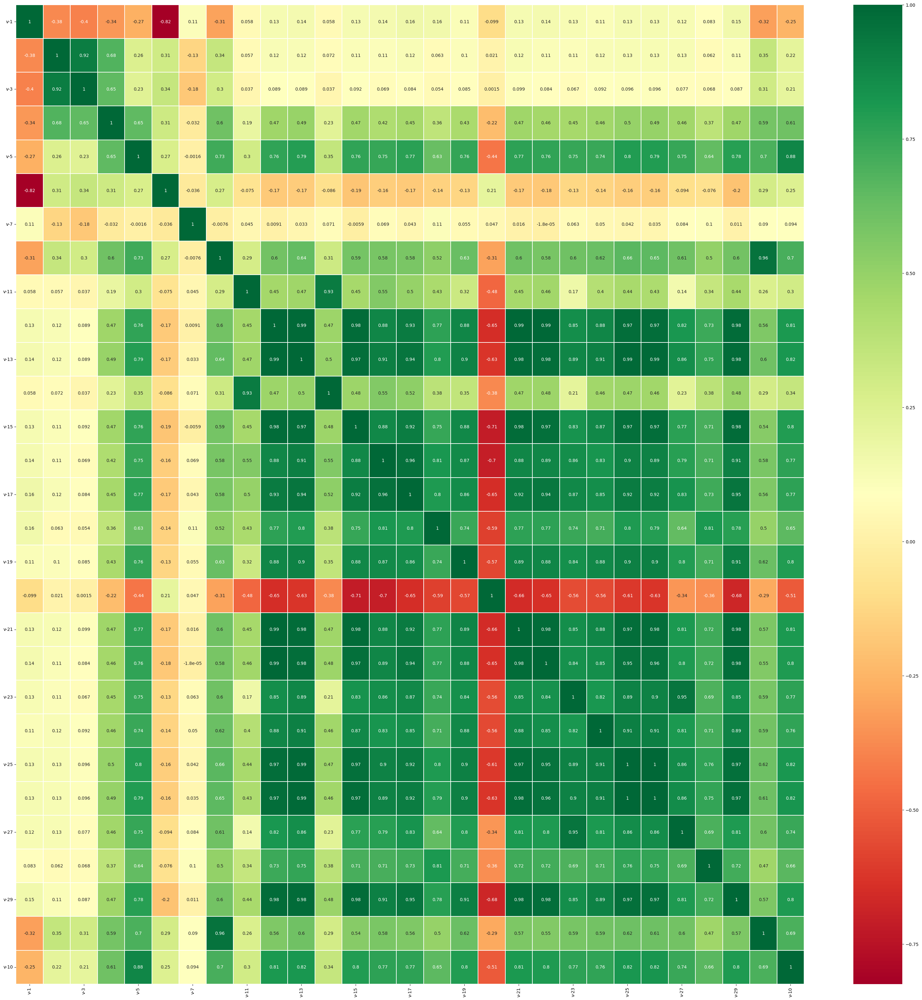

In [ ]:
import seaborn as sns
sns.heatmap(data_cleaned.corr(),annot=True,cmap='RdYlGn',linewidths=0.2) #data.corr()-->correlation matrix
fig=plt.gcf()
fig.set_size_inches(40,40)
plt.show()

**Result:**

* The correlation between v1 and v8 is relatively weak.
* Most show a strong positive correlation between v12 and v28.
* v20 is special variable that shows a negative correlation with other variables.
* The correlation between v25 and v26 is 1, and there is a covariance problem.


### Featutre Engineering

In [15]:
import statsmodels.api as sm
import statsmodels.formula.api as smf
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from mlxtend.feature_selection import ExhaustiveFeatureSelector as EFS
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

1.  Add the constant column.
A column of ones was incorporated using the sm.add_constant() function, ensuring that the model could better fit the data and produce more accurate predictions.


<font color="red">Code:</font>

In [16]:
X = data_cleaned.iloc[:, :-2]
X = sm.add_constant(X) # Including a column of ones to handle the constant term.
Y = data_cleaned.iloc[:, -2:]

scaler = StandardScaler()
X = scaler.fit_transform(X)

Y = scaler.fit_transform(Y)

2.  Use the backward method to select the best variables.

<font color="red">Code:</font>

In [19]:
sfs = SFS(LinearRegression(),
          k_features="best",
          fixed_features = (0,),
          forward=False,
          scoring='neg_mean_squared_error',
          cv=5)
sfs = sfs.fit(X, Y)

print('Best MSE score:', -sfs.k_score_)
print('\nBest subset:', sfs.k_feature_names_)

sfs.subsets_


Best MSE score: 0.1090618018547734

Best subset: ('0', '5', '6', '7', '8', '9', '10', '12', '13', '14', '15', '16', '17', '21', '22', '24', '25', '26', '27')


{28: {'feature_idx': (0,
   1,
   2,
   3,
   4,
   5,
   6,
   7,
   8,
   9,
   10,
   11,
   12,
   13,
   14,
   15,
   16,
   17,
   18,
   19,
   20,
   21,
   22,
   23,
   24,
   25,
   26,
   27),
  'cv_scores': array([-0.37172843, -0.15618139, -0.2756563 , -0.16186119, -0.35744094]),
  'avg_score': -0.26457364890571267,
  'feature_names': ('0',
   '1',
   '2',
   '3',
   '4',
   '5',
   '6',
   '7',
   '8',
   '9',
   '10',
   '11',
   '12',
   '13',
   '14',
   '15',
   '16',
   '17',
   '18',
   '19',
   '20',
   '21',
   '22',
   '23',
   '24',
   '25',
   '26',
   '27')},
 27: {'feature_idx': (0,
   2,
   3,
   4,
   5,
   6,
   7,
   8,
   9,
   10,
   11,
   12,
   13,
   14,
   15,
   16,
   17,
   18,
   19,
   20,
   21,
   22,
   23,
   24,
   25,
   26,
   27),
  'cv_scores': array([-0.43076347, -0.15355974, -0.06511577, -0.05010484, -0.20045925]),
  'avg_score': -0.18000061333588765,
  'feature_names': ('0',
   '2',
   '3',
   '4',
   '5',
   '6',
   '7',
   '8',


3.  Use the forward method to select the best variables.

<font color="red">Code:</font>

In [20]:
sfs = SFS(LinearRegression(),
          k_features="best",
          fixed_features = (0,),
          forward=True,

          scoring='neg_mean_squared_error',
          cv=5)
sfs = sfs.fit(X, Y)

print('Best MSE score:', -sfs.k_score_)
print('\nBest subset:', sfs.k_feature_names_)

sfs.subsets_

Best MSE score: 0.10584450992430365

Best subset: ('0', '1', '2', '5', '7', '8', '9', '12', '13', '16', '17', '18', '19', '27')


{1: {'feature_idx': (0,),
  'cv_scores': array([-1.76804249, -1.16501253, -0.76414237, -0.88294176, -0.70379251]),
  'avg_score': -1.0567863319510942,
  'feature_names': ('0',)},
 2: {'feature_idx': (0, 8),
  'cv_scores': array([-0.70393036, -0.32960705, -0.12936848, -0.13677016, -0.19066235]),
  'avg_score': -0.298067677141567,
  'feature_names': ('0', '8')},
 3: {'feature_idx': (0, 5, 8),
  'cv_scores': array([-0.47054299, -0.16958911, -0.03817839, -0.02501633, -0.05356822]),
  'avg_score': -0.15137900701636914,
  'feature_names': ('0', '5', '8')},
 4: {'feature_idx': (0, 5, 7, 8),
  'cv_scores': array([-0.45633491, -0.15486785, -0.03019373, -0.02822669, -0.04713468]),
  'avg_score': -0.14335157030088588,
  'feature_names': ('0', '5', '7', '8')},
 5: {'feature_idx': (0, 5, 7, 8, 18),
  'cv_scores': array([-0.42793873, -0.1432561 , -0.0278883 , -0.02480537, -0.05441964]),
  'avg_score': -0.1356616277329455,
  'feature_names': ('0', '5', '7', '8', '18')},
 6: {'feature_idx': (0, 1, 5, 

4.  Use the Best Subset method to select the best variables.

<font color="red">Code:</font>

In [21]:
from mlxtend.feature_selection import ExhaustiveFeatureSelector as EFS
X = data_cleaned.iloc[:, :-2]
X = sm.add_constant(X) # Including a column of ones to handle the constant term.
y = data_cleaned.iloc[:, -2:]

efs = EFS(LinearRegression(),
          min_features=1,
          max_features=4,
          fixed_features = (0,),
          scoring='neg_mean_squared_error',
          cv=5)
efs = efs.fit(X, y)
print('Best MSE score:', -sfs.k_score_)
print('Best subset:', efs.best_feature_names_,'\n')

efs.subsets_

Features: 3304/3304

Best MSE score: 0.10584450992430365
Best subset: ('const', 'v-5', 'v-7', 'v-8') 



{0: {'feature_idx': (0,),
  'cv_scores': array([-417141.76506171, -289530.194859  , -195483.75019703,
         -213243.65245151, -176261.35956273]),
  'avg_score': -258332.14442639737,
  'feature_names': ('const',)},
 1: {'feature_idx': (0, 1),
  'cv_scores': array([-328881.35266961, -273545.49589852, -191262.28484196,
         -156768.67781189, -265763.95078055]),
  'avg_score': -243244.35240050446,
  'feature_names': ('const', 'v-1')},
 2: {'feature_idx': (0, 2),
  'cv_scores': array([-324996.17905976, -248171.43652819, -211988.95691806,
         -178407.95411141, -144476.21051245]),
  'avg_score': -221608.14742597082,
  'feature_names': ('const', 'v-2')},
 3: {'feature_idx': (0, 3),
  'cv_scores': array([-344586.67450673, -259351.21386714, -202001.08510508,
         -179499.55575202, -150341.08837368]),
  'avg_score': -227155.92352093005,
  'feature_names': ('const', 'v-3')},
 4: {'feature_idx': (0, 4),
  'cv_scores': array([-254722.38611817, -161049.67110479, -141299.245116  ,
    

5.  Use the correlation matrix to see the correlation in the best subset and use pairplot to see the relationships.

<font color="red">Code:</font>


Correlation matrix:
          v-5       v-7       v-8
v-5  1.000000 -0.001584  0.726328
v-7 -0.001584  1.000000 -0.007645
v-8  0.726328 -0.007645  1.000000


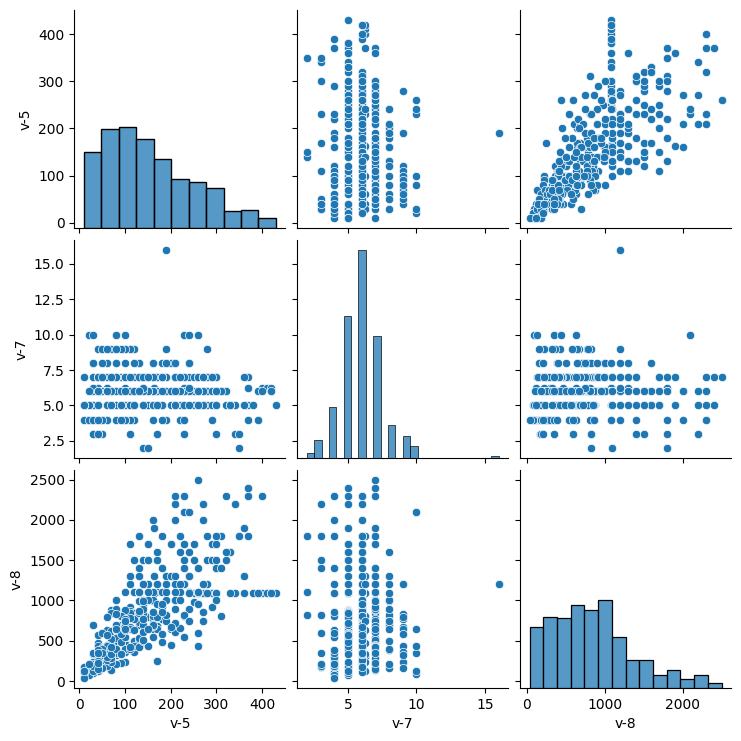

In [22]:
best_subset = data[['v-5', 'v-7', 'v-8']]

correlation_matrix = best_subset.corr()
print("\nCorrelation matrix:")
print(correlation_matrix)

sns.pairplot(best_subset)
plt.show()

**Result:**
*   From the correlation matrix, the linear relationship between v5, v7, and v8 are
all very weak,indicating the feasibility of the best subset.

### Model Building

1.  Remove hyphens and keep only the first part of each column name.


<font color="red">Code:</font>

In [23]:
data_cleaned.columns = data_cleaned.columns.map(lambda x:x.split()[0].replace('-', ''))

2.  Converts all elements in the data_cleaned data frame to integer types.

<font color="red">Code:</font>

In [24]:
data_cleaned = data_cleaned.map(int)

3.  MultiOutputRegressor Model based on the best subset and do the visualization.

<font color="red">Code:</font>

In [25]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.multioutput import MultiOutputRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.decomposition import PCA
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split, cross_val_predict, cross_val_score


X = data_cleaned[['v5','v7','v8']]
y = data_cleaned[['v9', 'v10']]

# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.8, random_state=42)

# Create a linear regression model
linear_model = LinearRegression()
multi_output_model = MultiOutputRegressor(linear_model)

# Fit the model
multi_output_model.fit(X_train, y_train)

# Calculate prediction value
y_train_pred = multi_output_model.predict(X_train)
y_test_pred = multi_output_model.predict(X_test)

# MSE、RMSE and MAE
mse_train = mean_squared_error(y_train, y_train_pred)
rmse_train = np.sqrt(mse_train)
mae_train = mean_absolute_error(y_train, y_train_pred)

mse_test = mean_squared_error(y_test, y_test_pred)
rmse_test = np.sqrt(mse_test)
mae_test = mean_absolute_error(y_test, y_test_pred)

# R-squared
r2_train = r2_score(y_train, y_train_pred)
r2_test = r2_score(y_test, y_test_pred)

# Output
print(f"Train Set MSE: {mse_train}, RMSE: {rmse_train}, MAE: {mae_train}, R²: {r2_train}")
print(f"Test  Set MSE: {mse_test},  RMSE: {rmse_test},  MAE: {mae_test},  R²: {r2_test}")

Train Set MSE: 0.05287418733951551, RMSE: 0.22994387867372226, MAE: 0.12860972529253087, R²: 0.9278478010076296
Test  Set MSE: 0.16500219845600325,  RMSE: 0.40620462633505694,  MAE: 0.1881627094812017,  R²: 0.8440230294255027


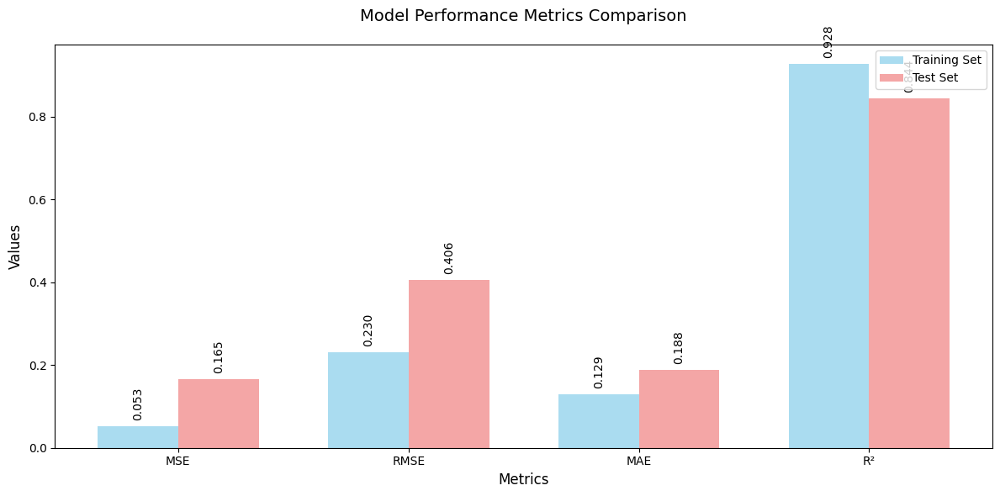

In [26]:
# Creating Comparison Visualizations
import matplotlib.pyplot as plt
import numpy as np

# Prepare data
metrics = ['MSE', 'RMSE', 'MAE', 'R²']
train_values = [mse_train, rmse_train, mae_train, r2_train]
test_values = [mse_test, rmse_test, mae_test, r2_test]

plt.figure(figsize=(12, 6))
x = np.arange(len(metrics))
width = 0.35

plt.bar(x - width/2, train_values, width, label='Training Set', color='skyblue', alpha=0.7)
plt.bar(x + width/2, test_values, width, label='Test Set', color='lightcoral', alpha=0.7)

plt.title('Model Performance Metrics Comparison', fontsize=14, pad=20)
plt.xlabel('Metrics', fontsize=12)
plt.ylabel('Values', fontsize=12)

plt.xticks(x, metrics)

def add_value_labels(ax, spacing=5):
    for rect in ax.patches:
        y_value = rect.get_height()
        x_value = rect.get_x() + rect.get_width() / 2

        label = f'{y_value:.3f}'

        ax.annotate(label,
                   (x_value, y_value),
                   xytext=(0, spacing),
                   textcoords="offset points",
                   ha='center',
                   va='bottom',
                   rotation=90)

add_value_labels(plt.gca())
plt.legend()
plt.tight_layout()
plt.show()

4.  MultiOutputRegressor Model based on the best subset and do PCA to find the new subset.

<font color="red">Code:</font>

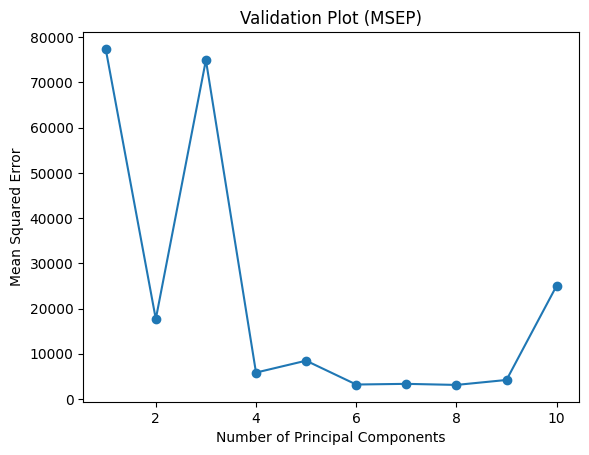

           PC1        PC2
v5   71.999429  65.863064
v7   -0.010705   0.001887
v8  525.754189  -9.019620
Top features for Principal Component 1:
v8    525.754189
v5     71.999429
Name: PC1, dtype: float64
Top features for Principal Component 2:
v5    65.863064
v8     9.019620
Name: PC2, dtype: float64


In [27]:
X = data_cleaned[['v5','v7','v8']].values
y = data_cleaned[['v9', 'v10']].values

# PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

cv_scores = cross_val_score(LinearRegression(), X_pca, y, cv=10, scoring='neg_mean_squared_error')

plt.plot(range(1, len(cv_scores) + 1), -cv_scores, marker='o')
plt.xlabel('Number of Principal Components')
plt.ylabel('Mean Squared Error')
plt.title('Validation Plot (MSEP)')
plt.show()

# Calculate the characteristic load
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)

# Create a DataFrame for easy viewing, making sure the number of columns matches the number of principal components
loadings_df = pd.DataFrame(loadings, index=['v5', 'v7', 'v8'], columns=[f'PC{i+1}' for i in range(2)])

# View Characteristic Loads
print(loadings_df)

# Find the feature that contributes most to each principal component
for i in range(loadings_df.shape[1]):
    print(f"Top features for Principal Component {i+1}:")
    top_features = loadings_df.iloc[:, i].abs().nlargest(2)
    print(top_features)

**Result:**
*   v8 (greatest contribution in PC1)
*   v7 (minimal contribution)
*   v5  v8  is needed

5.  MultiOutputRegressor Model based on the best subset after PCA the new subset is (v5, v8).


<font color="red">Code:</font>

In [28]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.multioutput import MultiOutputRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np


X = data_cleaned[['v8','v5']]
y = data_cleaned[['v9', 'v10']]

# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.8, random_state=42)

# Create a linear regression model
linear_model = LinearRegression()
multi_output_model = MultiOutputRegressor(linear_model)

# Fit the model
multi_output_model.fit(X_train, y_train)

# Calculate prediction value
y_train_pred = multi_output_model.predict(X_train)
y_test_pred = multi_output_model.predict(X_test)

# MSE、RMSE and MAE
mse_train = mean_squared_error(y_train, y_train_pred)
rmse_train = np.sqrt(mse_train)
mae_train = mean_absolute_error(y_train, y_train_pred)

mse_test = mean_squared_error(y_test, y_test_pred)
rmse_test = np.sqrt(mse_test)
mae_test = mean_absolute_error(y_test, y_test_pred)

# R-squared
r2_train = r2_score(y_train, y_train_pred)
r2_test = r2_score(y_test, y_test_pred)

# Output
print(f"Train Set MSE: {mse_train}, RMSE: {rmse_train}, MAE: {mae_train}, R²: {r2_train}")
print(f"Test  Set MSE: {mse_test},  RMSE: {rmse_test},  MAE: {mae_test},  R²: {r2_test}")

Train Set MSE: 0.05660339729575201, RMSE: 0.2379146849098475, MAE: 0.13713283582172878, R²: 0.9230483756974641
Test  Set MSE: 0.17459179247787682,  RMSE: 0.41784182710432044,  MAE: 0.199927387200882,  R²: 0.8349158344494236


**Result:**
*   After doing PCA the MSE increases but R Square decreases
So it is not that good after PCA.

6.  All the variables after PCA to get the new subset.

<font color="red">Code:</font>

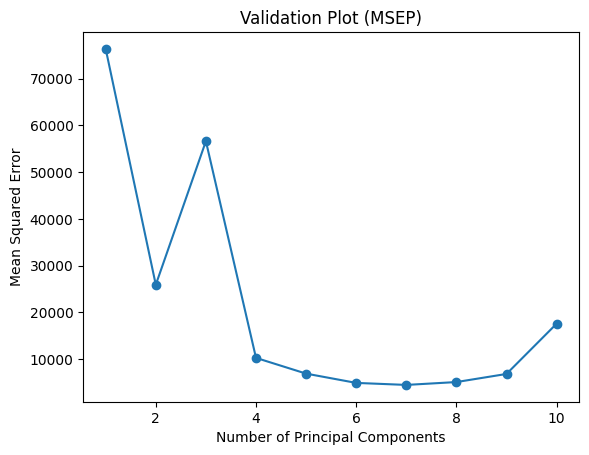

               PC1           PC2          PC3          PC4          PC5  \
v1        0.953014     -0.674333    -0.491211    -0.232244    -0.199374   
v2       96.350978     -8.939321    10.613082    -6.040065   -55.700879   
v3       17.617021      5.829890     4.462108     1.378267    -0.957582   
v4       83.925650     -2.385915    15.485938   -13.828480   -13.264559   
v5       75.590513     -9.502063    17.952490    -7.796748    -4.977821   
v6      -36.483652      6.142288    30.717872    -1.326684     1.420945   
v7        0.003221     -0.144762     0.212523    -0.096278     0.057486   
v8      314.043227    -32.705052   126.789471    -6.755723   -26.744555   
v11     637.650837     80.119932  -386.767279    33.035000   570.659764   
v12      52.560398      0.748864     1.855673    -2.453923    -0.677201   
v14       0.490879     -0.011647    -0.352343    -0.001010     0.439658   
v15  476231.821429  47041.635308    41.497561     9.791856    -6.063656   
v16    1956.735503   -315

In [29]:
# All the variables after PCA to get V29, V15, V19
X = data_cleaned[['v1', 'v2', 'v3', 'v4', 'v5', 'v6', 'v7', 'v8', 'v11', 'v12', 'v14', 'v15', 'v16', 'v17', 'v18', 'v19', 'v20', 'v21', 'v22', 'v23', 'v24', 'v25', 'v26', 'v27', 'v28', 'v29']].values
y = data_cleaned[['v9', 'v10']].values

# PCA
pca = PCA(n_components=10)
X_pca = pca.fit_transform(X)

# Cross-validation to compute mean squared error
cv_scores = cross_val_score(LinearRegression(), X_pca, y, cv=10, scoring='neg_mean_squared_error')

# Plotting the validation graph
plt.plot(range(1, len(cv_scores) + 1), -cv_scores, marker='o')
plt.xlabel('Number of Principal Components')
plt.ylabel('Mean Squared Error')
plt.title('Validation Plot (MSEP)')
plt.show()

# Calculate feature loadings
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)

# Create a DataFrame for easy viewing
loadings_df = pd.DataFrame(loadings, index=['v1', 'v2', 'v3', 'v4', 'v5', 'v6', 'v7', 'v8', 'v11', 'v12', 'v14', 'v15', 'v16', 'v17', 'v18', 'v19', 'v20', 'v21', 'v22', 'v23', 'v24', 'v25', 'v26', 'v27', 'v28', 'v29'], columns=[f'PC{i+1}' for i in range(10)])

# View feature loadings
print(loadings_df)

# Identify the top contributing features for each principal component
for i in range(loadings_df.shape[1]):
    print(f"Top features for Principal Component {i+1}:")
    top_features = loadings_df.iloc[:, i].abs().nlargest(3)  # Get the three features with the largest contributions
    print(top_features)

**Result:**

*   v29: 530327.990417 (largest contribution)
*   v15: 476231.821429 (second largest contribution)
*   v19: 7572.631581 (third largest contribution)

This shows that:
*   v29 is the most important characterizing variable
*   v15 and v29 together explain most of the data variance
*   (v15, v19, v29) is the new subset

7.  MultiOutputRegressor Model based on all the variables after PCA and the new subsetc is (v15, v19, v29).


<font color="red">Code:</font>

In [30]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.multioutput import MultiOutputRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np


X = data_cleaned[['v15','v19','v29']]
y = data_cleaned[['v9', 'v10']]

# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# Create a linear regression model
linear_model = LinearRegression()
multi_output_model = MultiOutputRegressor(linear_model)

# Fit the model
multi_output_model.fit(X_train, y_train)

# Calculate prediction value
y_train_pred = multi_output_model.predict(X_train)
y_test_pred = multi_output_model.predict(X_test)

# MSE、RMSE and MAE
mse_train = mean_squared_error(y_train, y_train_pred)
rmse_train = np.sqrt(mse_train)
mae_train = mean_absolute_error(y_train, y_train_pred)

mse_test = mean_squared_error(y_test, y_test_pred)
rmse_test = np.sqrt(mse_test)
mae_test = mean_absolute_error(y_test, y_test_pred)

# R-squared
r2_train = r2_score(y_train, y_train_pred)
r2_test = r2_score(y_test, y_test_pred)

# Output
print(f"Train Set MSE: {mse_train}, RMSE: {rmse_train}, MAE: {mae_train}, R²: {r2_train}")
print(f"Test  Set MSE: {mse_test},  RMSE: {rmse_test},  MAE: {mae_test},  R²: {r2_test}")

Train Set MSE: 0.43332337115867303, RMSE: 0.6582730217460481, MAE: 0.49349063064746, R²: 0.5217045647686183
Test  Set MSE: 0.6162984369811046,  RMSE: 0.7850467737537073,  MAE: 0.5697863471327997,  R²: 0.5383429812963563


**Result:**

*   After selecting all the variables and doing PCA the MSE increases but R Square decreases
so it is not that good when all the variables do PCA.

In [31]:
pip install ISLP

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 kB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 42.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 349.3/349.3 kB 17.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 522.0/522.0 kB 24.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 36.4/36.4 MB 27.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 815.2/815.2 kB 30.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 926.4/926.4 kB 33.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.5/94.5 kB 5.5 MB/s eta 0:00:00
  Created wheel for autograd-gamma: filename=autograd_gamma-0.5.0-py3-none-any.whl size=4031 sha256=55e7cce9886b30174cdede311f3f877155a7ae7f5a36ef57ae882fd34cbe536b
  Stored in directory: /root/.cache/pip/wheels/25/cc/e0/ef2969164144c899fedb22b338f6703e2b9cf46eeebf254991
Successfully built autograd-gamma
  Attempting un

In [32]:
import pandas as pd
import numpy as np
from ISLP import load_data
from sklearn.linear_model import ElasticNet
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import ElasticNetCV
from sklearn.linear_model import MultiTaskLassoCV

8.  MultiTaskLassoCV Model based on the best subset by finding the best alpha automatically.

<font color="red">Code:</font>

In [33]:
#Do Standardization then but do not define alpha
X = data_cleaned[['v5','v7','v8']].values
y = data_cleaned[['v9', 'v10']].values
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

lasso_cv = MultiTaskLassoCV(cv=10)
lasso_cv.fit(X_scaled, y)

y_pred = lasso_cv.predict(X_scaled)
mse = mean_squared_error(y, y_pred)
r2 = r2_score(y, y_pred)

print(f"MSE: {mse}")
print(f"R²: {r2}")

best_alpha1 = lasso_cv.alpha_
print(f"Best alpha: {best_alpha1}")

coef = lasso_cv.coef_
sel = np.where(coef != 0)[0]

print("Number of non-zero coefficients:", len(sel))

MSE: 19833.956294881864
R²: 0.8613525930137378
Best alpha: 1.2340565594647617
Number of non-zero coefficients: 6


9.  MultiTaskLassoCV Model based on best subset and find the best alpha by Alpha Grid Search method.

<font color="red">Code:</font>

In [34]:
#Do standardization and Define alpha
X = data_cleaned[['v5','v7','v8']].values
y = data_cleaned[['v9', 'v10']].values
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

grid = np.logspace(10, -2, num=10)

lasso_cv = MultiTaskLassoCV(alphas=grid,cv=10)
lasso_cv.fit(X_scaled, y)

y_pred = lasso_cv.predict(X_scaled)
mse = mean_squared_error(y, y_pred)
r2 = r2_score(y, y_pred)

print(f"MSE: {mse}")
print(f"R²: {r2}")

best_alpha2 = lasso_cv.alpha_
print(f"Best alpha: {best_alpha2}")

coef = lasso_cv.coef_
sel = np.where(coef != 0)[0]

print("Number of non-zero coefficients:", len(sel))

MSE: 19830.290558762736
R²: 0.8614330582254197
Best alpha: 0.21544346900318867
Number of non-zero coefficients: 6


10.  MultiTaskLassoCV Model based on all the variables by finding the best alpha automatically.

<font color="red">Code:</font>

In [35]:
#Do standardization then but do not define the alpha(All variables)
X = data_cleaned[['v1', 'v2', 'v3','v4','v5', 'v6', 'v7', 'v8', 'v11', 'v12', 'v14', 'v15','v16','v17','v18','v19','v20', 'v21','v22','v23','v24','v25','v26','v27','v28','v29']].values
y = data_cleaned[['v9', 'v10']].values
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

lasso_cv = MultiTaskLassoCV(cv=10)
lasso_cv.fit(X_scaled, y)

y_pred = lasso_cv.predict(X_scaled)
mse = mean_squared_error(y, y_pred)
r2 = r2_score(y, y_pred)

print(f"MSE: {mse}")
print(f"R²: {r2}")

best_alpha3 = lasso_cv.alpha_
print(f"Best alpha: {best_alpha3}")

coef = lasso_cv.coef_
sel = np.where(coef != 0)[0]

print("Number of non-zero coefficients:", len(sel))



MSE: 13705.655555267203
R²: 0.9184699242222714
Best alpha: 0.6585788692160702
Number of non-zero coefficients: 50


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:2639: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 77274.61057044007, tolerance: 17994.17363844086
  ) = cd_fast.enet_coordinate_descent_multi_task(


11.  MultiTaskLassoCV Model based on all the variables and find the best alpha by Alpha Grid Search method.

<font color="red">Code:</font>

In [38]:
# Standardization and define the alpha (All variables)
X = data_cleaned[['v1', 'v2', 'v3', 'v4', 'v5', 'v6', 'v7', 'v8', 'v11', 'v12', 'v14', 'v15', 'v16', 'v17', 'v18', 'v19', 'v20', 'v21', 'v22', 'v23', 'v24', 'v25', 'v26', 'v27', 'v28', 'v29']].values
y = data_cleaned[['v9', 'v10']].values
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

grid = np.logspace(10, -2, num=10)

lasso_cv = MultiTaskLassoCV(alphas=grid, cv=10)
lasso_cv.fit(X_scaled, y)

# Calculate MSE and R²
y_pred = lasso_cv.predict(X_scaled)  # Predict using training data
mse = mean_squared_error(y, y_pred)   # Calculate MSE
r2 = r2_score(y, y_pred)              # Calculate R²

# Output MSE and R²
print(f"MSE: {mse}")
print(f"R²: {r2}")

best_alpha3 = lasso_cv.alpha_
print(f"Best alpha: {best_alpha3}")

coef = lasso_cv.coef_
sel = np.where(coef != 0)[0]

print("Number of non-zero coefficients:", len(sel))



/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:675: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 510790.08041983936, tolerance: 14635.3469497006
  model = cd_fast.enet_coordinate_descent_multi_task(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:675: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2443889.9615686, tolerance: 14635.3469497006
  model = cd_fast.enet_coordinate_descent_multi_task(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:675: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 378443.1677738875, tolerance: 15553.18195958084
  model = cd_fast.enet_coordinate_descent_multi_task(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:675:

MSE: 13444.47113509378
R²: 0.9222371493888576
Best alpha: 0.21544346900318867
Number of non-zero coefficients: 52


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:675: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 227134.17558270507, tolerance: 16903.382738507466
  model = cd_fast.enet_coordinate_descent_multi_task(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:675: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4195255.884548742, tolerance: 16903.382738507466
  model = cd_fast.enet_coordinate_descent_multi_task(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:675: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 330838.41348157823, tolerance: 16523.3512638806
  model = cd_fast.enet_coordinate_descent_multi_task(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.p

12.  MultiTaskLassoCV Model based on all the variables after PCA by finding the best alpha automatically.

<font color="red">Code:</font>

In [39]:
#All the variables after standardization and PCA and do not define the alpha
X = data_cleaned[['v15','v19','v29']].values
y = data_cleaned[['v9', 'v10']].values

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

lasso_cv = MultiTaskLassoCV(cv=10)
lasso_cv.fit(X_scaled, y)

y_pred = lasso_cv.predict(X_scaled)
mse = mean_squared_error(y, y_pred)
r2 = r2_score(y, y_pred)

print(f"MSE: {mse}")
print(f"R²: {r2}")

best_alpha = lasso_cv.alpha_
print(f"Best alpha: {best_alpha}")

coef = lasso_cv.coef_
sel = np.where(coef != 0)[0]

print("Number of non-zero coefficients:", len(sel))

MSE: 145956.86847737167
R²: 0.5228065895956465
Best alpha: 12.454516073205625
Number of non-zero coefficients: 4


13.  MultiTaskLassoCV Model based on all the variables after PCA and find the best alpha by Alpha Grid Search method.

<font color="red">Code:</font>

In [40]:
#All the variables after standardization and PCA and define the alpha
X = data_cleaned[['v15','v19','v29']].values
y = data_cleaned[['v9', 'v10']].values

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

grid = np.logspace(10, -2, num=10)

lasso_cv = MultiTaskLassoCV(alphas=grid, cv=10)
lasso_cv.fit(X_scaled, y)

coef = lasso_cv.coef_
sel = np.where(coef != 0)[0]

y_pred = lasso_cv.predict(X_scaled)
mse = mean_squared_error(y, y_pred)
r2 = r2_score(y, y_pred)

print(f"MSE: {mse}")
print(f"R²: {r2}")

best_alpha = lasso_cv.alpha_
print(f"Best alpha: {best_alpha}")
print("Number of non-zero coefficients:", len(sel))

MSE: 145633.75783492715
R²: 0.5298091667344351
Best alpha: 4.641588833612792
Number of non-zero coefficients: 6


**Result:**
*   Regularization effect: By choosing the right alpha value, the model is able to maintain a certain level of complexity while preventing overfitting.
*   All methods perform very poor Mean Squared Error (MSE) values although they all have the high score on R^2
so the results generated by MultiTaskLassoCV Model are excluded eventually.